<h1>Music Box Chords</h1>

In [105]:
%matplotlib inline
import matplotlib.pyplot as plt

In [106]:
import os
import IPython.display as ipd
import librosa
import librosa.display
from pydub import AudioSegment
from pydub.utils import make_chunks
from itertools import combinations
from tqdm.notebook import trange, tqdm
from IPython.display import Audio
import math 
import random

<h2>Raw Wave Files</h2>
The raw music box sample sound files were from
<a href="https://freesound.org/people/UbikPhonik/packs/11206/" target="foo">freesound.org</a>. The sound files were originally in .aiff format.  I converted them manually with Audacity.

In [2]:
musicBoxSamplesDir = "./sounds/raw_wav"

In [3]:
musicBoxSampleFiles = [x for x in os.listdir(musicBoxSamplesDir) if x.endswith(".wav")]
musicBoxSampleFiles

['177940__ubikphonik__g2.wav',
 '177941__ubikphonik__g1.wav',
 '177942__ubikphonik__f2.wav',
 '177943__ubikphonik__f1.wav',
 '177944__ubikphonik__bb1.wav',
 '177945__ubikphonik__ab3.wav',
 '177946__ubikphonik__ab2.wav',
 '177947__ubikphonik__ab1.wav',
 '177948__ubikphonik__c1.wav',
 '177949__ubikphonik__bb2.wav',
 '177950__ubikphonik__db1.wav',
 '177951__ubikphonik__c2.wav',
 '177952__ubikphonik__db2.wav',
 '177953__ubikphonik__eb2.wav',
 '177954__ubikphonik__eb1.wav']

<h2>Sample wav file</h2>
Look at a sample music box sound file.

In [16]:
musicBoxSampleFile = "{}/{}".format(musicBoxSamplesDir, musicBoxSampleFiles[1])
musicBoxSampleFile

'./sounds/raw_wav/177941__ubikphonik__g1.wav'

In [17]:
ipd.Audio(musicBoxSampleFile)

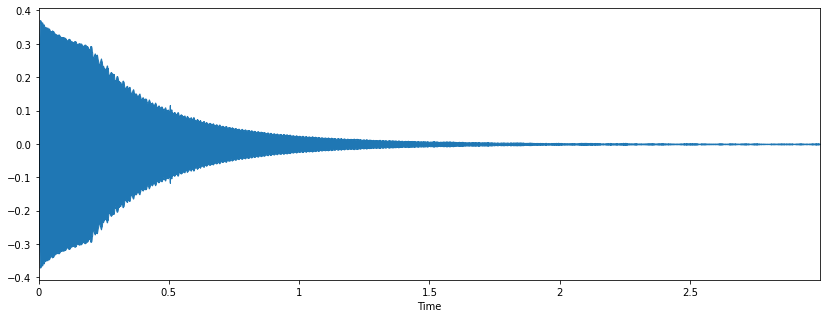

In [18]:
x, sr = librosa.load(musicBoxSampleFile)
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

<h2>Clip sample wav file</h2>
Clip sample wav file to 1 sec. It should be easier to merge the sound files if they're all the same length. 

In [19]:
def clipWav(inFile, outFile, chunk_length_ms = 1000):
    myaudio = AudioSegment.from_file(inFile, "wav") 
    chunks = make_chunks(myaudio, chunk_length_ms) #Make chunks of one sec
    
    dirname = os.path.dirname(outFile)
    os.makedirs(dirname, exist_ok=True)
    
    chunks[0].export(outFile, format="wav")

In [20]:
musicBoxClippedDir = "./sounds/clipped_wav/note_1"
musicBoxClippedFile = "{}/{}".format(musicBoxClippedDir, musicBoxSampleFiles[0].split("_")[-1])
musicBoxClippedFile

'./sounds/clipped_wav/note_1/g2.wav'

In [21]:
(musicBoxSampleFile, musicBoxClippedFile)

('./sounds/raw_wav/177941__ubikphonik__g1.wav',
 './sounds/clipped_wav/note_1/g2.wav')

In [22]:
clipWav(musicBoxSampleFile, musicBoxClippedFile)

In [45]:
print(isinstance(musicBoxClippedFile, str))
print(isinstance(musicBoxClippedFile, bytes))
ipd.Audio(musicBoxClippedFile)

True
False


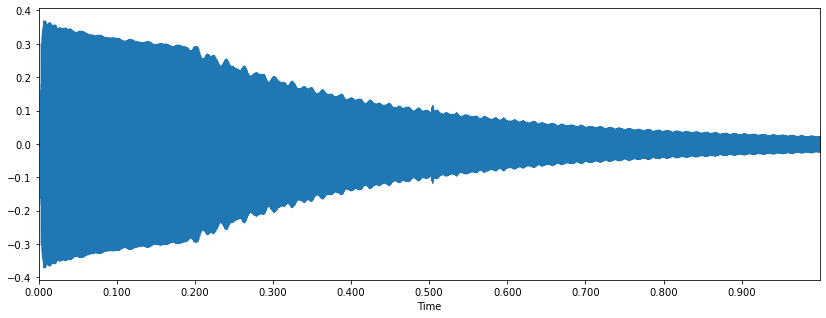

In [24]:
x, sr = librosa.load(musicBoxClippedFile)
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

<h2>Clip all wav files</h2>
Clip all of the wav files to the same length (1s).  This will make things easier when merging them.

In [25]:
for musicBoxSampleFile in musicBoxSampleFiles:
    inFile = "{}/{}".format(musicBoxSamplesDir, musicBoxSampleFile)
    
    # just use the note for the name
    outFile = "{}/{}".format(musicBoxClippedDir, musicBoxSampleFile.split("_")[-1])
    clipWav(inFile, outFile)

<h2>Get Notes</h2>
The notes are in A Flat Major Scale.  
http://www.piano-keyboard-guide.com/a-flat-major-scale.html

<img src="http://www.piano-keyboard-guide.com/wp-content/uploads/2015/04/a-flat-major-scale-treble-clef.png">
<img src="http://www.piano-keyboard-guide.com/wp-content/uploads/2015/04/a-flat-major-scale-bass-clef.png">

If you want the notes in a different scale than A Flat Major, you will have to get your own music box sample sound files.

In [26]:
def getNotes(musicBoxClippedDir):
    return [x.split(".")[0] for x in os.listdir(musicBoxClippedDir) if x.endswith(".wav")]

notes = getNotes(musicBoxClippedDir)
notes

['ab1',
 'ab2',
 'ab3',
 'bb1',
 'bb2',
 'c1',
 'c2',
 'db1',
 'db2',
 'eb1',
 'eb2',
 'f1',
 'f2',
 'g1',
 'g2']

In [74]:
print("Number of Notes: {}".format(len(notes)))

Number of Notes: 15


Maybe the correct order should be:
['ab1', 'bb1', 'c1', 'db1', 'eb1', 'f1', 'g1', 'ab2', 'bb2', 'c2', 'db2', 'eb2', 'f2', 'g2', 'ab3']

I'm a piano school dropout so I'm not 100% sure. Ok. Let's try to play them in order and see if that sounds right.

In [58]:
def concatSoundFiles(soundFilePaths, outFile, format="wav"):
    combined = AudioSegment.empty()

    for soundFilePath in soundFilePaths:
      combined += AudioSegment.from_file(soundFilePath)
    
    dirname = os.path.dirname(outFile)
    os.makedirs(dirname, exist_ok=True)

    combined.export(outFile, format=format)

In [61]:
def getFilePathFromNote(fileDir, note):
    fileNames = [x for x in os.listdir(fileDir) if x.endswith(".wav")]
    
    for fileName in fileNames:
        if (fileName.split(".")[0].endswith(note)):
            return "{}/{}".format(fileDir, fileName)
        
    return ""

Let's concatenate all of the raw sound files in order and try playing it.

In [62]:
notesInOrder = ["ab1", "bb1", "c1", "db1", "eb1", "f1", "g1", "ab2", "bb2", "c2", "db2", "eb2", "f2", "g2", "ab3"]
rawAudioFilePaths = [getFilePathFromNote("./sounds/raw_wav", note) for note in notesInOrder]

outFile = "./combined/raw.wav"
concatSoundFiles(rawAudioFilePaths, outFile)

ipd.Audio(outFile)

Ok. I guess that sounds about right.

<h1>Chording</h1>
Maybe "chording" isn't exactly the correct term. Basically, we just need to find all of the possible combinations of notes whether or not they actually make a chord or not. 

In [63]:
def getAllNoteCombinations(notes, r, includeSingleCombinations=False):
    c = []
    
    startRange = 0 if includeSingleCombinations else 1
    
    for i in range(startRange, r):
        c += list(combinations(notes, i+1))
        
    return c

In [97]:
twoNoteCombinations = getAllNoteCombinations(notes, 2)

Here are a couple of two note combinations:

In [98]:
twoNoteCombinations[:10]

[('ab1', 'ab2'),
 ('ab1', 'ab3'),
 ('ab1', 'bb1'),
 ('ab1', 'bb2'),
 ('ab1', 'c1'),
 ('ab1', 'c2'),
 ('ab1', 'db1'),
 ('ab1', 'db2'),
 ('ab1', 'eb1'),
 ('ab1', 'eb2')]

In [65]:
def mergeSoundFiles(filePathList, outFile, format="wav"):
    combinedSound = None
    
    for filePath in filePathList:
        if combinedSound is None:
            combinedSound = AudioSegment.from_file(filePath)
        else:
            combinedSound = combinedSound.overlay(AudioSegment.from_file(filePath))

    dirname = os.path.dirname(outFile)
    os.makedirs(dirname, exist_ok=True)
    
    combinedSound.export(outFile, format = format)

In [66]:
def makeMergeSoundFilePath(outDir, notes, format="wav"):
    notesFileName = "{}.{}".format("_".join(notes), format)

    return "{}/{}".format(outDir, notesFileName)

In [67]:
def mergeNotes(notes, inDir, outDir, format="wav"):
    filePathList = ["{}/{}.wav".format(inDir, note) for note in notes]
    outFilePath = makeMergeSoundFilePath(outDir, notes, format)
    
    mergeSoundFiles(filePathList, outFilePath, format)
    
    return outFilePath

In [70]:
sampleTwoNoteCombination = twoNoteCombinations[-10]
sampleTwoNoteCombination

('eb2', 'f1')

In [71]:
mergedNoteFilePath = mergeNotes(sampleTwoNoteCombination, "./sounds/clipped_wav/note_1", "./sounds/clipped_wav/note_2")
mergedNoteFilePath

'./sounds/clipped_wav/note_2/eb2_f1.wav'

In [72]:
ipd.Audio(mergedNoteFilePath)

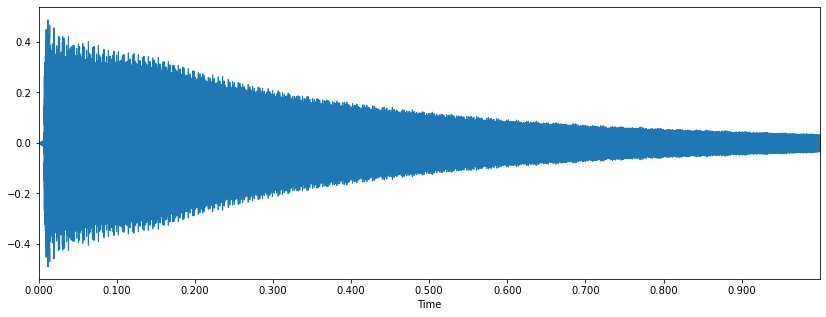

In [73]:
x, sr = librosa.load(mergedNoteFilePath)
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

In [75]:
def makeAllMergedNotes(noteCombinationList, inDir="./sounds/clipped_wav/note_1", topOutDir="./sounds/clipped_wav", outDirPrefix="note_", format="wav"):
    for i in trange(len(noteCombinationList)):
        noteCombination = noteCombinationList[i]
        numOfNotes = len(noteCombination)
        
        outDir = "{}/{}{}".format(topOutDir, outDirPrefix, numOfNotes)
        
        mergeNotes(noteCombination, inDir, outDir, format)

In [90]:
def nCr(n,r):
    f = math.factorial
    return f(n) / f(r) / f(n-r)

def nCsum(n, r):
    return sum(nCr(n, x+1) for x in range(r))

Max number of 5 notes for a chord should be fine. The more max number of notes you add, the more output files you will have and the longer it will take.

In [93]:
allNoteCombinations = getAllNoteCombinations(notes, 5, True)
assert(nCsum(15, 5) == len(allNoteCombinations))
print("Number of Chord Combinations: {}".format(len(allNoteCombinations)))

Number of Chord Combinations: 4943


15 notes will have this many combinations:

In [94]:
nCsum(15, 15)

32767.0

Here, I'm going to generate all of the mp3 files for all 1 to 5 note combinations. We're going to use "notes" because it's already in alphabetical order.  The format of the file names will be the notes which the chord contains in alphabetical order separated by an underscore.  This will probably be useful later when try to look for the chord file that you want. The chords will also be separated into directories based on the number of notes the chord has for faster lookup.

In [100]:
chordedDir = "./sounds/chorded_mp3"

In [ ]:
makeAllMergedNotes(allNoteCombinations, "./sounds/clipped_wav/note_1", chordedDir, "note_", "mp3")

In [102]:
# From https://thispointer.com/python-how-to-get-list-of-files-in-directory-and-sub-directories/

def getListOfFiles(dirName):
    # create a list of file and sub directories 
    # names in the given directory 
    listOfFile = os.listdir(dirName)
    allFiles = list()
    # Iterate over all the entries
    for entry in listOfFile:
        # Create full path
        # fullPath = os.path.join(dirName, entry)
        fullPath = "{}/{}".format(dirName, entry)
        
        # If entry is a directory then get the list of files in this directory 
        if os.path.isdir(fullPath):
            allFiles = allFiles + getListOfFiles(fullPath)
        else:
            allFiles.append(fullPath)
                
    return allFiles

<h2>Play a random chord</h2>
First, let's get all of the chord files.

In [103]:
allChordFilePaths = getListOfFiles(chordedDir)
allChordFilePaths[:10]

['./sounds/chorded_mp3/note_1/ab1.mp3',
 './sounds/chorded_mp3/note_1/ab2.mp3',
 './sounds/chorded_mp3/note_1/ab3.mp3',
 './sounds/chorded_mp3/note_1/bb1.mp3',
 './sounds/chorded_mp3/note_1/bb2.mp3',
 './sounds/chorded_mp3/note_1/c1.mp3',
 './sounds/chorded_mp3/note_1/c2.mp3',
 './sounds/chorded_mp3/note_1/db1.mp3',
 './sounds/chorded_mp3/note_1/db2.mp3',
 './sounds/chorded_mp3/note_1/eb1.mp3']

Refresh the cell below to pick a random chord to play.

In [117]:
randomChordPath = random.choice(allChordFilePaths)
print(randomChordPath)
ipd.Audio(randomChordPath, autoplay=True)

./sounds/chorded_mp3/note_3/ab3_db1_g1.mp3
